In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import sys
from skimage import io, exposure, transform
import cv2 as cv
import yaml

In [2]:
main_dir = '/ocean/projects/asc170022p/singla/ExplainingBBSmoothly'

# Get explainer training config

In [28]:
config = os.path.join(main_dir, 'configs/Step_4_MIMIC_Explainer_256_Pleural_Effusion.yaml')
config = yaml.load(open(config))
for k in config.keys():
    print(k, config[k])

('cls_experiment', 'output/classifier/StanfordCheXpert_256')
('suffix', '_train_set_1')
('image_dir', '')
('count_to_save', 50)
('names_to_save', '')
('lambda_cls', 1)
('cls_loss_type', 'kl')
('batch_size', 8)
('num_channel', 1)
('epochs', 300)
('unet_loss_type', 'weighted')
('unet_experiment', 'output/segmentation/JSRT_256/Lung/ckpt_dir')
('img_to_save', '')
('discriminator_type', 'Discriminator_Ordinal')
('target_class', 1)
('save_summary', 500)
('crop_size', 225)
('num_class', 14)
('name', 'Explainer_MIMIC_Pleural_Effusion')
('ckpt_dir_continue', 'output/classifier/StanfordCheXpert_256/Explainer_MIMIC_Pleural_Effusion')
('test_dir', '')
('feature', True)
('seed', 0)
('lambda_GAN', 1)
('log_dir', 'output/classifier/StanfordCheXpert_256')
('feature_names', 'dense_4')
('input_size', 256)
('image_label_dict', 'output/classifier/StanfordCheXpert_256/Explainer_MIMIC_Pleural_Effusion/list_attr_Pleural_Effusion.txt')
('num_bins', 10)
('lambda_cyc', 100)


In [29]:
config['disease_name'] = 'pleural_effusion'

# Read explainer output data

Modify config:

* names_to_save: ''
* img_to_save: ''
* suffix: '_train_set'
* test_dir: ''
* count_to_save: 500

This config will save results on randomly choozen 500 samples from training set of the explainer. To save results on use-specified files, either provide a numpy array with location of the files in 'names_to_save' or an numpy array of images in 'img_to_save'. User can also provide a location to save the results in 'test_dir'. By default the results get saved in os.path.join(main_dir, config['log_dir'], config['name'], 'test')

**Run**
```
python Step_4_test_explainer.py --config 'configs/Step_4_MIMIC_Explainer_256_Pleural_Effusion.yaml'
```

In [5]:
output_dir = os.path.join(main_dir, config['log_dir'], config['name'])

In [30]:
test_dir = os.path.join(output_dir, 'test'  )
names = np.load(os.path.join(test_dir, 'names'+config['suffix']+'.npy'))
real_img = np.load(os.path.join(test_dir, 'real_img'+config['suffix']+'.npy'))
fake_img = np.load(os.path.join(test_dir, 'fake_img'+config['suffix']+'.npy'))
real_pred = np.load(os.path.join(test_dir, 'real_pred'+config['suffix']+'.npy'))
fake_pred = np.load(os.path.join(test_dir, 'fake_pred'+config['suffix']+'.npy'))
print(names.shape, real_img.shape, fake_img.shape, real_pred.shape, fake_pred.shape)
fake_img = np.reshape(fake_img, [-1, config['num_bins'], config['input_size'], config['input_size'], config['num_channel']])
real_pred = np.reshape(real_pred, [-1, config['num_bins'], config['num_class']])
real_pred = np.mean(real_pred, axis=1)
fake_pred = np.reshape(fake_pred, [-1, config['num_bins'], config['num_class']])
print(names.shape, real_img.shape, fake_img.shape, real_pred.shape, fake_pred.shape)

((52,), (52, 256, 256, 1), (520, 256, 256, 1), (520, 14), (520, 14))
((52,), (52, 256, 256, 1), (52, 10, 256, 256, 1), (52, 14), (52, 10, 14))


# Costrophenic Recess detector

In [7]:
import sys
import os
import tensorflow as tf
import numpy as np
import scipy.io as sio
from PIL import Image
sys.path.append("../")
from Fast_RCNN.rpn_proposal.utils import  generate_anchors, pre_process_xml, read_data, resize_img_bbox
from Fast_RCNN.unified_network.networks import unified_net
from Fast_RCNN.unified_network.ops import offset2bbox, non_max_suppression
from utils import load_images_and_labels
import pdb
import scipy.misc as scm
import xml.etree.ElementTree as ET
import yaml
import seaborn as sns
import random
import warnings
import time
from scipy.ndimage.filters import gaussian_filter
import argparse
warnings.filterwarnings("ignore", category=DeprecationWarning) 
tf.set_random_seed(0)
np.random.seed(0)

import matplotlib.pyplot as plt
import matplotlib.patches as patches

In [8]:
config_od = 'configs/Step_3_MIMIC_Object_Detector_256_Costophrenic_Recess.yaml'
config_path = os.path.join(main_dir, config_od)
config_od = yaml.load(open(config_path))
print(config_od)

{'SUFFIX': '.jpeg', 'image_dir': '', 'LEARNING_RATE': 0.001, 'vgg_checkpoint': 'output/classifier/StanfordCheXpert_256_VGG/cp_epoch0.ckpt', 'CROP': False, 'num_channel': 1, 'POOLED_H': 7, 'MINIBATCH': 64, 'XML_PATH': '/ocean/projects/asc170022p/singla/CSV_MIMIC/ObjectDetector_PA/costophrenic/xml/', 'POOLED_W': 7, 'NMS_THRESHOLD': 0.7, 'IMG_PATH': '/ocean/projects/asc170022p/singla/CSV_MIMIC/ObjectDetector_PA/costophrenic/img/', 'IMG_W': 256, 'name': 'costophrenic_test', 'ckpt_dir_continue': 'output/ObjectDetector/costophrenic_test', 'EPSILON': 1e-07, 'BATCHSIZE': 2, 'CLASSES': ['costophrenic', 'normal'], 'NUMS_PROPOSAL': 2000, 'WEIGHT_DECAY': 0.0005, 'starting_step': 2, 'IMG_H': 256, 'MOMENTUM': 0.9, 'log_dir': 'output/ObjectDetector'}


In [9]:
config_od['ckpt_dir_continue'] = "output/ObjectDetector/costophrenic_test"
config_od['name'] ="costophrenic"

In [10]:
# ============= Experiment Parameters =============
name = config_od['name']
batch_size = 1 #config['BATCHSIZE']
channels = config_od['num_channel']
IMG_H = config_od['IMG_H'] 
IMG_W = config_od['IMG_W'] 
MINIBATCH = 256 #config['MINIBATCH'] 
NUMS_PROPOSAL = 300 #config['NUMS_PROPOSAL'] 
NMS_THRESHOLD = 0.7 #config['NMS_THRESHOLD'] 
XML_PATH = config_od['XML_PATH']
IMG_PATH = config_od['IMG_PATH']
CLASSES = config_od['CLASSES']

In [11]:
anchors = generate_anchors(IMG_H, IMG_W)

imgs = tf.placeholder(tf.float32, [None, IMG_H, IMG_W, 1])
cls, reg, proposal, vgg_logits = unified_net(imgs, anchors, CLASSES,  NUMS_PROPOSAL, NMS_THRESHOLD, IMG_H, IMG_W)

x0, y0, x1, y1 = proposal[:, 0:1], proposal[:, 1:2], proposal[:, 2:3], proposal[:, 3:4]
x, y, w, h = (x0 + x1) / 2, (y0 + y1) / 2, x1 - x0, y1 - y0
proposal = tf.concat([x, y, w, h], axis=1)
normal_bbox, reverse_bbox = offset2bbox(reg, proposal)
cls = tf.nn.softmax(cls)
boxes, score, classes = non_max_suppression(cls, reverse_bbox,  CLASSES)

('inputs: ', <tf.Tensor 'vgg_16/conv5/conv5_3/Relu:0' shape=(?, 16, 16, 512) dtype=float32>)


('rpn_cls: ', <tf.Tensor 'Reshape:0' shape=(?, ?, 2) dtype=float32>)
('normal_bbox: ', <tf.Tensor 'embedding_lookup_1/Identity:0' shape=(?, 4) dtype=float32>)
('reverse_bbox: ', <tf.Tensor 'div_4:0' shape=(?, 4) dtype=float32>)
('bbox_idx: ', <tf.Tensor 'zeros:0' shape=(300,) dtype=int32>)
Instructions for updating:
box_ind is deprecated, use box_indices instead
('inputs: ', <tf.Tensor 'vgg_16_1/dropout7/dropout/mul_1:0' shape=(300, 1, 1, 4096) dtype=float32>)
('inputs: ', <tf.Tensor 'Squeeze:0' shape=(300, 4096) dtype=float32>)
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [12]:
assets_dir = os.path.join(main_dir, config_od['log_dir'], config_od['name'])
ckpt_dir = os.path.join(assets_dir, 'ckpt_dir')
ckpt_dir

'/ocean/projects/asc170022p/singla/ExplainingBBSmoothly/output/ObjectDetector/costophrenic/ckpt_dir'

In [13]:
sess = tf.Session()
sess.run(tf.global_variables_initializer())
fast_rcnn_var = tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope="vgg_16") + \
                tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope="classification") + \
                tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope="regression")
rpn_var = tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES, scope="rpn")
saver = tf.train.Saver(fast_rcnn_var)
saver.restore(sess, os.path.join(ckpt_dir,"model_frcnn_step6_"+name+".ckpt"))
print("Fast RCNN Check point restored", os.path.join(ckpt_dir,"model_frcnn_step6_"+name+".ckpt"))
print("Done.......")
saver = tf.train.Saver(rpn_var)
saver.restore(sess, os.path.join(ckpt_dir,"model_rpn_step4_"+name+".ckpt"))
print("Model RPN Check point restored", os.path.join(ckpt_dir,"model_rpn_step4_"+name+".ckpt"))
print("Done.......")

Instructions for updating:
Use standard file APIs to check for files with this prefix.
INFO:tensorflow:Restoring parameters from /ocean/projects/asc170022p/singla/ExplainingBBSmoothly/output/ObjectDetector/costophrenic/ckpt_dir/model_frcnn_step6_costophrenic.ckpt
('Fast RCNN Check point restored', '/ocean/projects/asc170022p/singla/ExplainingBBSmoothly/output/ObjectDetector/costophrenic/ckpt_dir/model_frcnn_step6_costophrenic.ckpt')
Done.......
INFO:tensorflow:Restoring parameters from /ocean/projects/asc170022p/singla/ExplainingBBSmoothly/output/ObjectDetector/costophrenic/ckpt_dir/model_rpn_step4_costophrenic.ckpt
('Model RPN Check point restored', '/ocean/projects/asc170022p/singla/ExplainingBBSmoothly/output/ObjectDetector/costophrenic/ckpt_dir/model_rpn_step4_costophrenic.ckpt')
Done.......


# Lung segmentation

In [14]:
from unet.SegmentationNetwork import UNET

In [15]:
x_source = tf.placeholder(tf.float32, [None, config['input_size'], config['input_size'], config['num_channel']])
x_mask = tf.placeholder(tf.float32, [None, config['input_size'], config['input_size'], config['num_channel']]) 
U = UNET() 
_, seg_x_source = U(x_source)


('x: ', <tf.Tensor 'Placeholder_1:0' shape=(?, 256, 256, 1) dtype=float32>)
Instructions for updating:
Use `tf.keras.layers.Conv2D` instead.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
('conv1: ', <tf.Tensor 'UNet/conv2d_1/Relu:0' shape=(?, 256, 256, 32) dtype=float32>)
Instructions for updating:
Use keras.layers.MaxPooling2D instead.
('pool1: ', <tf.Tensor 'UNet/max_pooling2d/MaxPool:0' shape=(?, 128, 128, 32) dtype=float32>)
('conv2: ', <tf.Tensor 'UNet/conv2d_3/Relu:0' shape=(?, 128, 128, 64) dtype=float32>)
('pool2: ', <tf.Tensor 'UNet/max_pooling2d_1/MaxPool:0' shape=(?, 64, 64, 64) dtype=float32>)



In [16]:
import tensorflow.contrib.slim as slim

In [17]:
ckpt_dir_continue = os.path.join(main_dir, config['ckpt_dir_continue'], 'ckpt_dir')
class_vars = [var for var in slim.get_variables_to_restore() if 'UNet' in var.name]
name_to_var_map_local = {var.op.name: var for var in class_vars}               
temp_saver = tf.train.Saver(var_list=name_to_var_map_local)
ckpt = tf.train.get_checkpoint_state(ckpt_dir_continue) 
ckpt_name = os.path.basename(ckpt.model_checkpoint_path)
temp_saver.restore(sess, os.path.join(ckpt_dir_continue, ckpt_name))

INFO:tensorflow:Restoring parameters from /ocean/projects/asc170022p/singla/ExplainingBBSmoothly/output/classifier/StanfordCheXpert_256/Explainer_MIMIC_Pleural_Effusion/ckpt_dir/model98500.ckpt


# Visualize  Qualitative Results

In [18]:
from scipy.ndimage.filters import gaussian_filter
import seaborn as sns
from skimage import morphology

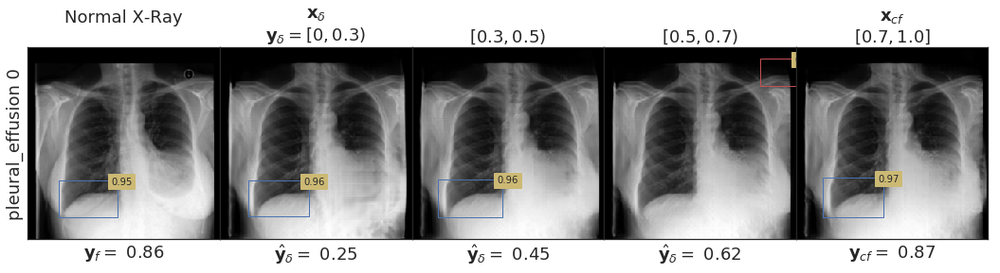

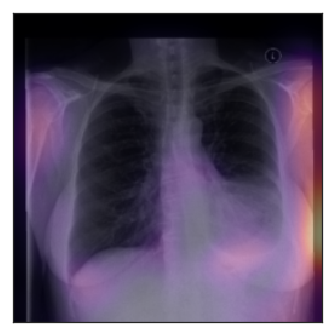

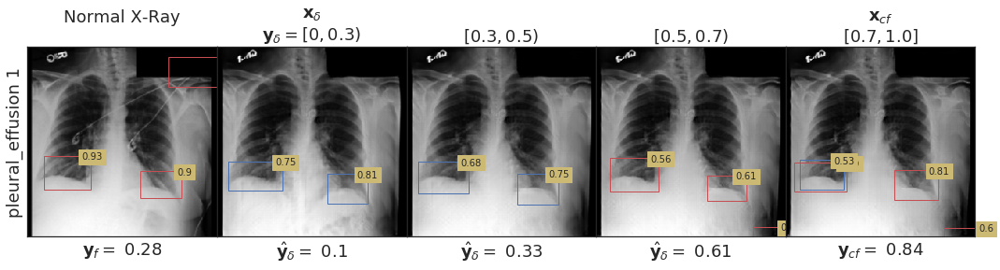

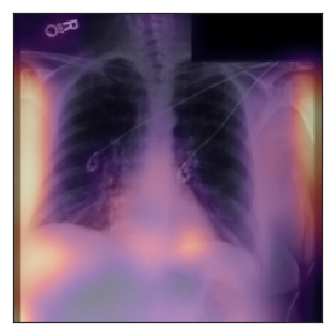

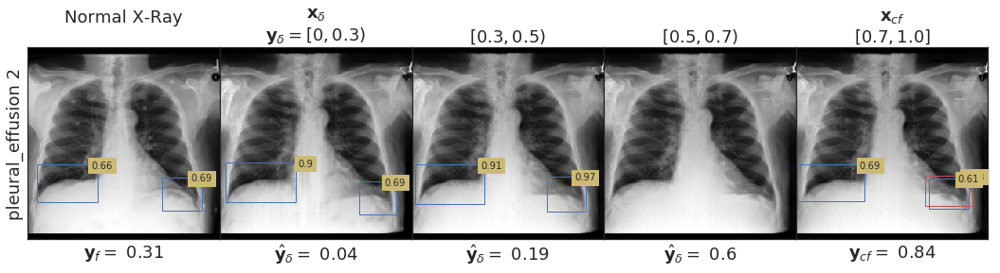

...

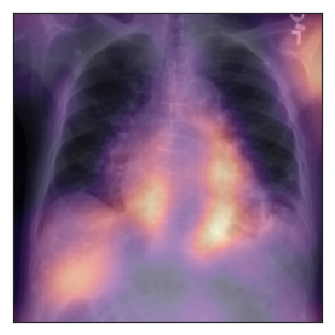

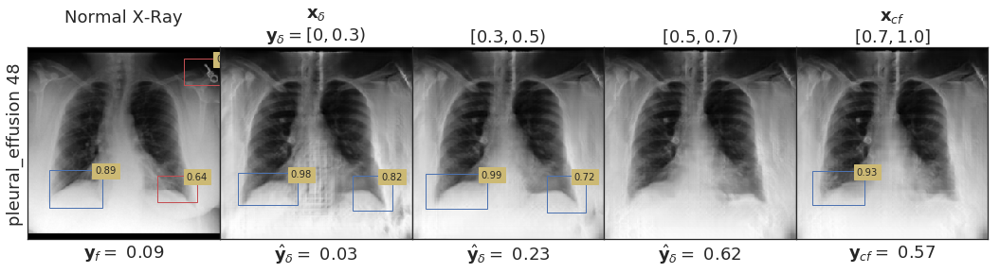

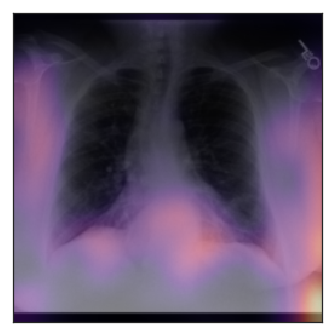

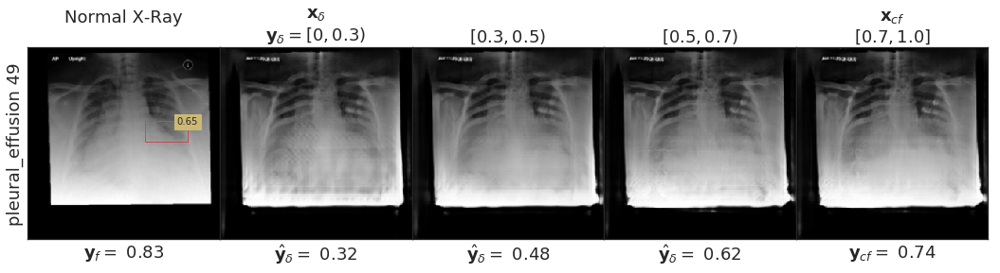

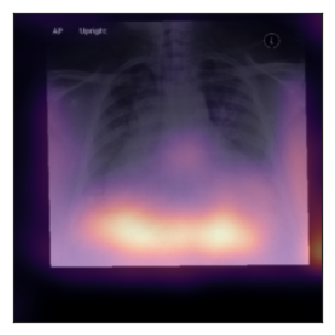

In [31]:
sns.set(color_codes=True)
sns.set(style="white")
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2})
title = ['Normal X-Ray\n', '$\mathbf{x}_{\delta}$' + '\n' + '$\mathbf{y}_{\delta} = [0, 0.3)$',\
         '' + '\n' + '$ [0.3, 0.5)$', '' + '\n' + '$ [0.5, 0.7)$', '$\mathbf{x}_{cf}$' + '\n' + '$[0.7, 1.0]$']
cols = 5
# [13, 35,33]
for ii in range(0,50): 
    fig,ax = plt.subplots(1,cols,figsize=(15,5))
    ax_index = 0
    for j in [10,0,3,6,8]:
        if j == 10:
            im = real_img[ii,:,:,:]
        else:
            im = fake_img[ii,j,:,:,:]
        im = np.interp(im, (im.min(), im.max()), (-1, +1))
        IMGS = np.reshape(im, [1,256,256,1])

        _cls = sess.run([cls, reg, proposal],feed_dict={imgs: IMGS})
        [BBOX, SCORE, CLS] = sess.run([boxes, score, classes], feed_dict={imgs: IMGS})
        
        ax[ax_index].imshow(IMGS[0,:,:,0],cmap='gray')
        ax[ax_index].set_xticks([])
        ax[ax_index].set_yticks([])
        ax[ax_index].set_title(title[ax_index])


        if ax_index == 0:
            ax[ax_index].set_ylabel(config['disease_name'] + ' ' + str(ii))
            ax[ax_index].set_xlabel('$\mathbf{y}_f = $ ' + str(np.round(real_pred[ii][config['target_class']],2)))
        elif ax_index == 4:
            ax[ax_index].set_xlabel('$\mathbf{y}_{cf} =$ ' + \
                                    str(np.round(fake_pred[ii][j][config['target_class']],2)) )
        else:
            ax[ax_index].set_xlabel('$\hat{\mathbf{y}}_{\delta} =$ ' + \
                                    str(np.round(fake_pred[ii][j][config['target_class']],2)) )
        SCORE = np.round(SCORE,2)
        for i in range(SCORE.shape[0]):   
            X0, Y0, X1, Y1 = BBOX[i, 0:1], BBOX[i, 1:2], BBOX[i, 2:3], BBOX[i, 3:4]
            X, Y, W, H = X0 , Y0, X1 - X0, Y1 - Y0
            if X[0]<0 or Y[0]<0:
                continue
            BBOX1 = np.concatenate((X, Y, W, H), axis=-1)
            area = H*W
            if area > 9999:
                continue
            #print(X[0],Y[0],SCORE[i], CLS[i],colors[i],area[0],j,ii)

            if CLS[i] == 0:
                c = 'r'
                cord_x = X[0]-5
                if j ==0 or j == 3:
                    continue
            else:
                if SCORE[i] > 0.5:
                    c = 'b'
                    if j == 6 or j == 9:
                        continue
                else:
                    continue
            cord_x = X[0] + W[0]+W[0]/4
            rect = patches.Rectangle((X,Y),W,H,linewidth=1,edgecolor=c,facecolor='none')
            ax[ax_index].add_patch(rect)
            ax[ax_index].text(cord_x, Y[0]-5, str(SCORE[i]), size=10, rotation=0,
                     ha="right", va="top",
                     bbox=dict(boxstyle="square",
                               ec='y',
                               fc='y',))    
            
        ax_index+=1
    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0.2)
    plt.show()
    img_to_show = np.abs(fake_img[ii,0,:,:,0]-fake_img[ii,8,:,:,0])
    img_to_show[img_to_show> 0.45]=0.45
    df3_smooth= gaussian_filter(img_to_show, sigma=10)
    plt.imshow(real_img[ii,:,:,0], cmap ='gray')
    plt.imshow(df3_smooth,cmap ='magma',alpha=0.5)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0.2)
    plt.show()

In [20]:
from scipy.ndimage.filters import gaussian_filter
import seaborn as sns
from skimage import morphology

def inverse_image(img): 
    img = (img + 1.) * 127.5
    img[img > 255] = 255.
    img[img < 0] = 0.
    return img.astype(np.uint8)

def get_new_image(img, mask):
    img = inverse_image(img)
    mask[mask!=0]=1
    heart_d = morphology.dilation(mask)
    heart_d = morphology.dilation(heart_d)
    heart_d = morphology.dilation(heart_d)
    boundary_lung = heart_d - mask
    boundary_lung[boundary_lung!=0]=1
    
    g_channel = np.copy(img)
    b_channel = np.copy(img)
    img[boundary_lung == 1] = 255
    g_channel[boundary_lung == 1] = 255
    b_channel[boundary_lung == 1] = 0
    I = np.dstack([img, g_channel, b_channel])
    return I

/ocean/projects/asc170022p/singla/anaconda/lib/python2.7/site-packages/skimage/morphology/misc.py:127: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  warn("Only one label was provided to `remove_small_objects`. "


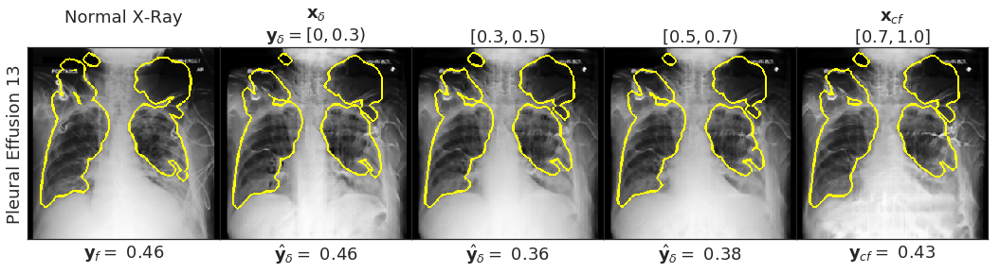

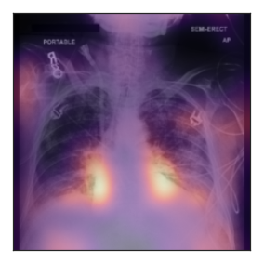

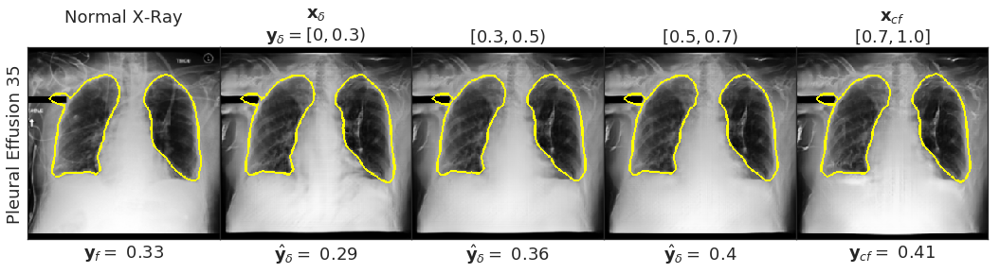

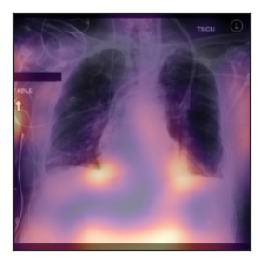

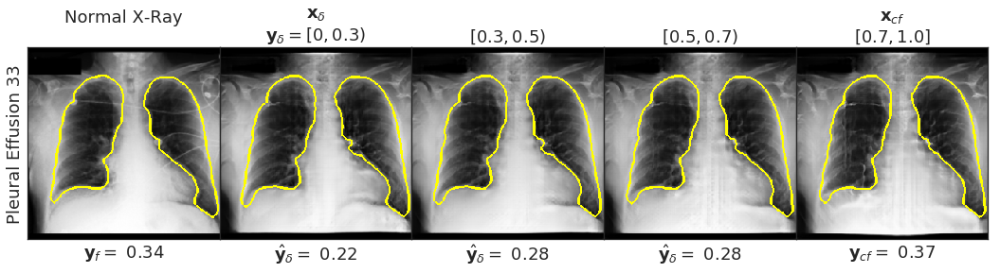

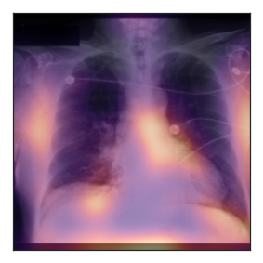

In [21]:
sns.set(color_codes=True)
sns.set(style="white")
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2})
title = ['Normal X-Ray\n', '$\mathbf{x}_{\delta}$' + '\n' + '$\mathbf{y}_{\delta} = [0, 0.3)$',\
         '' + '\n' + '$ [0.3, 0.5)$', '' + '\n' + '$ [0.5, 0.7)$', '$\mathbf{x}_{cf}$' + '\n' + '$[0.7, 1.0]$']
cols = 5
for ii in [ 35,33]: 
    fig,ax = plt.subplots(1,cols,figsize=(15,5))
    ax_index = 0
    for j in [10,0,3,6,9]:
        if j == 10:
            im = real_img[ii,:,:,:]
        else:
            im = fake_img[ii,j,:,:,:]

        IMGS = np.reshape(im, [1,256,256,1])
        [seg]  = sess.run([seg_x_source],  feed_dict={x_source: IMGS})
        
        ax[ax_index].imshow(IMGS[0,:,:,0],cmap='gray')
        ax[ax_index].set_xticks([])
        ax[ax_index].set_yticks([])
        ax[ax_index].set_title(title[ax_index])
        
        lung = seg[0,:,:,0]
        lung[lung>0.8]=1
        lung[lung!=1]=0
        lung = lung.astype(int)
        a = morphology.remove_small_objects(lung)
        a = morphology.remove_small_objects(a, min_size = 300)
        a = morphology.remove_small_objects(a)
        lung_a = a.astype(int)
        a1 = morphology.binary_dilation(lung_a)
        a2 = morphology.binary_dilation(a1)
        lung = lung_a+a1+a2
        edges_pz = get_new_image(IMGS[0,:,:,0],lung)
        #if j!= 10:
        ax[ax_index].imshow(edges_pz)
        if ax_index == 0:
            ax[ax_index].set_ylabel('Pleural Effusion ' + str(ii))
            ax[ax_index].set_xlabel('$\mathbf{y}_f = $ ' + str(np.round(real_pred[ii][9],2)))
        elif ax_index == 4:
            ax[ax_index].set_xlabel('$\mathbf{y}_{cf} =$ ' + \
                                    str(np.round(fake_pred[ii][j][9],2)))
        else:
            ax[ax_index].set_xlabel('$\hat{\mathbf{y}}_{\delta} =$ ' + \
                                    str(np.round(fake_pred[ii][j][9],2)))
        ax_index+=1
    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0.2)
    plt.show()
    img_to_show = np.abs(fake_img[ii,0,:,:,0]-fake_img[ii,9,:,:,0])
    img_to_show[img_to_show> 0.45]=0.45
    df3_smooth= gaussian_filter(img_to_show, sigma=10)
    plt.imshow(real_img[ii,:,:,0], cmap ='gray')
    plt.imshow(df3_smooth,cmap ='magma',alpha=0.5)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0.2)
    plt.show()

# Test: Generated images are fooling the classifier


In [30]:
main_index = config['target_class']
print(real_pred.shape, fake_pred.shape)
bins =  np.asarray(real_pred[:,main_index]*config['num_bins']).astype(int)
print(bins.shape)
print(np.unique(bins,return_counts=True))
print(np.min(np.unique(bins,return_counts=True)[1]))
fake_pred = np.reshape(fake_pred, [-1,config['num_class']])
print(real_pred.shape, fake_pred.shape)

((484, 14), (484, 10, 14))
(484,)
(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), array([53, 45, 52, 51, 41, 42, 46, 51, 52, 51]))
41
((484, 14), (4840, 14))


In [31]:
target_bin = np.tile(np.asarray(range(config['num_bins'])),bins.shape[0])
source_bin = np.repeat(bins, repeats=config['num_bins'])
source_pred = np.repeat(real_pred[:,main_index], repeats=config['num_bins'])
target_pred = fake_pred[:,main_index]
delta = target_bin-source_bin
print(target_bin.shape, source_bin.shape, source_pred.shape,target_pred.shape,delta.shape)
print(np.min(delta), np.max(delta))

((4840,), (4840,), (4840,), (4840,), (4840,))
(-9, 9)


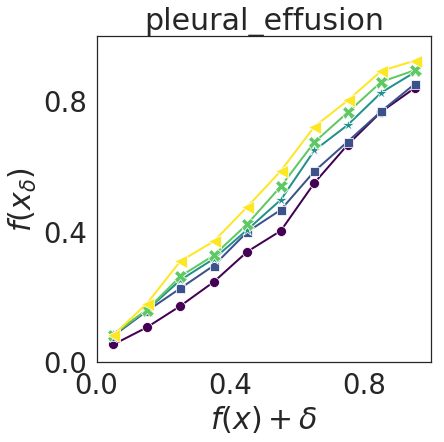

In [33]:
import seaborn as sns
sns.set(style="white")
sns.set_context("notebook", font_scale=2.5, rc={"lines.linewidth": 2})
from matplotlib import cm
colors = cm.get_cmap('viridis', 5)
newcolors = colors(np.linspace(0, 1, 5))

real_p = target_bin * 0.1
real_p_ = (target_bin+1) * 0.1
real_p = (real_p + real_p_)/2
fake_q = target_pred
fig = plt.figure(figsize = (6,6))
names = ['0.0-0.2', '', '0.2-0.4', '0.30-0.40', '0.4-0.6', '0.50-0.60', \
         '0.6-0.8', '0.70-0.80', '0.8-1.0', '0.90-1.00']
makrker_size = [10,0,9,0,13,0,13,0,13,0]
markers = ['o', '','s','','*', '','X', 'X', '<', '>', 's', '*', 'D', 'd', 'X']
x = np.arange(0.0, 1.0, step=0.1)
#plt.plot(x, x,c='black',linestyle='dashed',alpha=0.5) # dashdot black
for i in range(0,config['num_bins'],2):
    index = np.where(source_bin == i)
    target_pred_i = fake_q[index]
    source_pred_i = real_p[index]
    index = np.where(source_bin == i+1)
    target_pred_i = np.append(target_pred_i, fake_q[index],axis=0)
    source_pred_i = np.append(source_pred_i,real_p[index],axis=0)
    target_pred_i = np.reshape(target_pred_i,[-1,config['num_bins']])
    source_pred_i = np.reshape(source_pred_i,[-1,config['num_bins']])
    mean_t = np.mean(target_pred_i,0)
    sd_t = np.std(target_pred_i,0)           
    mean_s = np.mean(source_pred_i,0)
    sd_s = np.std(source_pred_i,0)
    x_axis = np.arange(0.0, 1.0, step=0.1)
    ax = sns.lineplot(mean_s,mean_t,label=names[i],c=newcolors[int(i/2)],\
                              alpha=1,marker=markers[i], markersize=makrker_size[i])
plt.xticks(np.arange(0, 1.1, step=0.2))
plt.yticks(np.arange(0, 1.1, step=0.2))
ax.get_legend().remove()
ax.xaxis.set_major_locator(plt.MaxNLocator(3))
ax.yaxis.set_major_locator(plt.MaxNLocator(3))
plt.xlabel( r'$f(x)+\delta$' )
plt.ylabel(r'$f(x_{\delta})$')
plt.title(config['disease_name'])
plt.show()

In [34]:
fake_pred = np.reshape(fake_pred, [-1, config['num_bins'], config['num_class']])
real_pred.shape, fake_pred.shape

((484, 14), (484, 10, 14))

# Visualize as gif

In [24]:
# choose samples to be saved
samples = [33]

In [25]:
import cv2
import imageio
sns.set(style="white")
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2})
from pylab import rcParams
rcParams['figure.figsize'] = 5, 5

i =0
temp_dir = os.path.join(main_dir, output_dir, 'gif')
try:
    os.makedirs(temp_dir)
    os.makedirs(os.path.join(temp_dir,'tmp','img_original'))
    os.makedirs(os.path.join(temp_dir,'tmp','img'))                
except:
    pass


fig = plt.figure()
for index in samples:
    plt.imshow(real_img[index,:,:,0],cmap='gray')
    plt.xticks([])
    plt.yticks([])
    cu_pre = str(np.round(real_pred[index][config['target_class']],
                          decimals=2))
    plt.title('$f(x)$=' + cu_pre)
    fig.savefig(temp_dir + "/tmp/img_original/example_"+config['disease_name']+
                "_index_" + str(index)+".png",\
                    bbox_inches='tight')
    plt.close()


    for j in range(9,-1,-1):
        fig, (ax, ax3) = plt.subplots(1,2, sharey=False,figsize=(13,5))
        img = fake_img[index,j,:,:,0]
        img = np.interp(img, [-1,1], [0,255])
        ax.imshow(img, cmap='gray') 
        ax.set_xticks([])
        ax.set_yticks([])

        ax3.set_ylabel(r'$p($Normal$ | x)$')
        ax3.set_ylim([0.0,1.1])    
        ax3.set_xlim([0,1.1])
        x = []
        y = []
        for k in range(9,j-1,-1):
            value = np.round(fake_pred[index,k,config['target_class']],decimals=2)
            x.append(1-k*0.1)
            y.append(1-value)
        ax3.yaxis.set_major_locator(plt.MaxNLocator(5))
        ax3.plot(x,y,  color='k',marker='o')
        ax3.tick_params(axis='y', colors='k')
        ax3.yaxis.label.set_color('k')              
        ax3.set_xticks([])

        #plt.show()
        fig.savefig(temp_dir+"/tmp/img/example_"+config['disease_name']+ "_" +
                    str(j)+ "_index_" \
                    + str(index)+".png",bbox_inches='tight')
        plt.close()
        #break
    with imageio.get_writer(temp_dir+'/'+config['disease_name']+'_'+cu_pre+'_'+str(index)+'.gif', mode='I') as writer:
        if float(cu_pre) > 0.5:
            for ii in range(9,-1,-1):
                filename = temp_dir+'/tmp/img/example_'+config['disease_name']+'_'+str(ii)+'_index_'+str(index)+'.png'
                image = imageio.imread(filename)
                writer.append_data(image)
                writer.append_data(image)
                writer.append_data(image)
                writer.append_data(image)
                writer.append_data(image)
                writer.append_data(image)
        else:
            for ii in range(0,10):
                filename = temp_dir+'/tmp/img/example_'+config['disease_name']+'_'+str(ii)+'_index_'+str(index)+'.png'
                image = imageio.imread(filename)
                writer.append_data(image)
                writer.append_data(image)
                writer.append_data(image)
                writer.append_data(image)
                writer.append_data(image)
                writer.append_data(image)
                writer.append_data(image)